# RPS: Measured vs Command

Compare measured (solid) and commanded (dashed) rotor speeds for all DREGON recordings
where both fields are present. One figure per recording, four subplots per figure (one per motor).

**Recordings with both fields** (all room1 except silent-flight):
- `free-flight_nosource_room1`
- `free-flight_speech-high_room1`
- `free-flight_speech-low_room1`
- `free-flight_whitenoise-high_room1`
- `free-flight_whitenoise-low_room1`

In [ ]:
from utils.paths import get_data_path


In [1]:
# %matplotlib widget
import sys
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
import scipy.io

sys.path.insert(0, str(Path.cwd().parent))


MOTOR_NAMES = ["RFront", "LFront", "LBack", "RBack"]

DATA_DIR = get_data_path("DREGON")

RECORDINGS = [
    "free-flight_nosource_room1",
    "free-flight_speech-high_room1",
    "free-flight_speech-low_room1",
    "free-flight_whitenoise-high_room1",
    "free-flight_whitenoise-low_room1",
]

In [2]:
def load_motor_data(recording_id):
    """Load motor timestamps, measured, and command from a DREGON recording."""
    dregon_dir = DATA_DIR / f"DREGON_{recording_id}"
    motors_path = dregon_dir / f"DREGON_{recording_id}_motors.mat"
    mat = scipy.io.loadmat(str(motors_path))
    motor = mat["motor"]
    ts = motor["timestamps"][0, 0].flatten()
    measured = motor["measured"][0, 0]   # (n_samples, 4)
    command = motor["command"][0, 0]      # (n_samples, 4)
    # Convert to relative time in seconds
    t_sec = ts - ts[0]
    return t_sec, measured, command


def plot_one_recording(recording_id, axs):
    """Plot measured (solid) vs command (dashed) for all 4 motors."""
    t, measured, command = load_motor_data(recording_id)

    for i, ax in enumerate(axs):
        ax.plot(t, measured[:, i], linewidth=0.6, alpha=0.85, label="measured")
        ax.plot(t, command[:, i], linewidth=0.6, alpha=0.85, linestyle="--", label="command")
        ax.set_ylabel(f"{MOTOR_NAMES[i]}\n(RPS, Hz)")
        if i == 0:
            ax.legend(fontsize=7, loc="upper right")
        if i < 3:
            ax.set_xticklabels([])
    axs[-1].set_xlabel("Time (s)")
    axs[0].set_title(recording_id, fontsize=10, fontweight="bold")

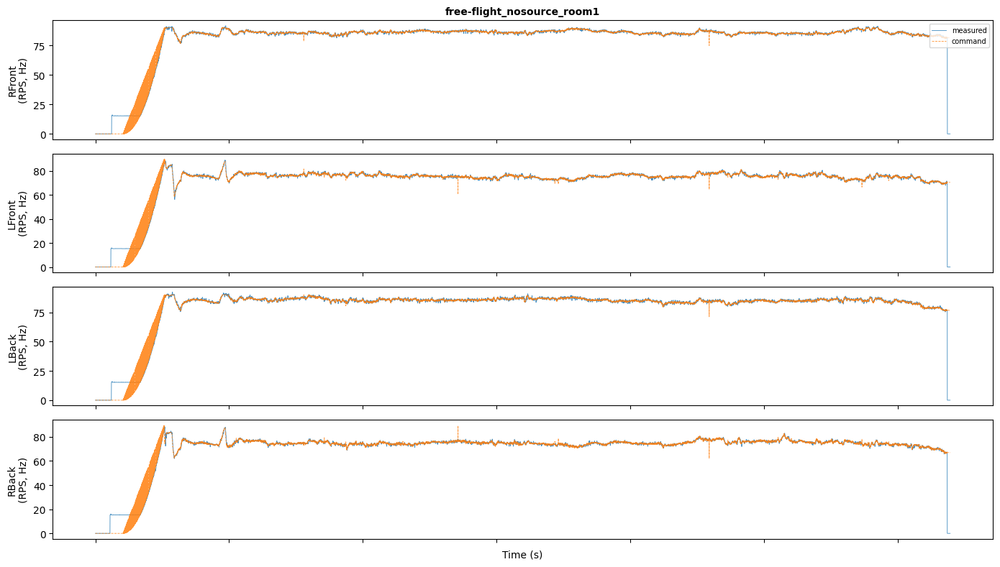

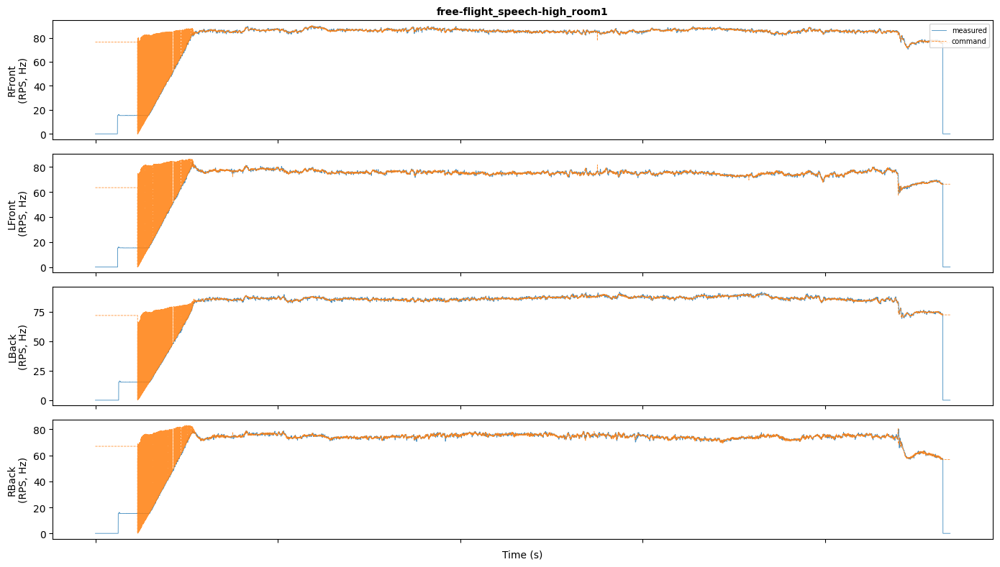

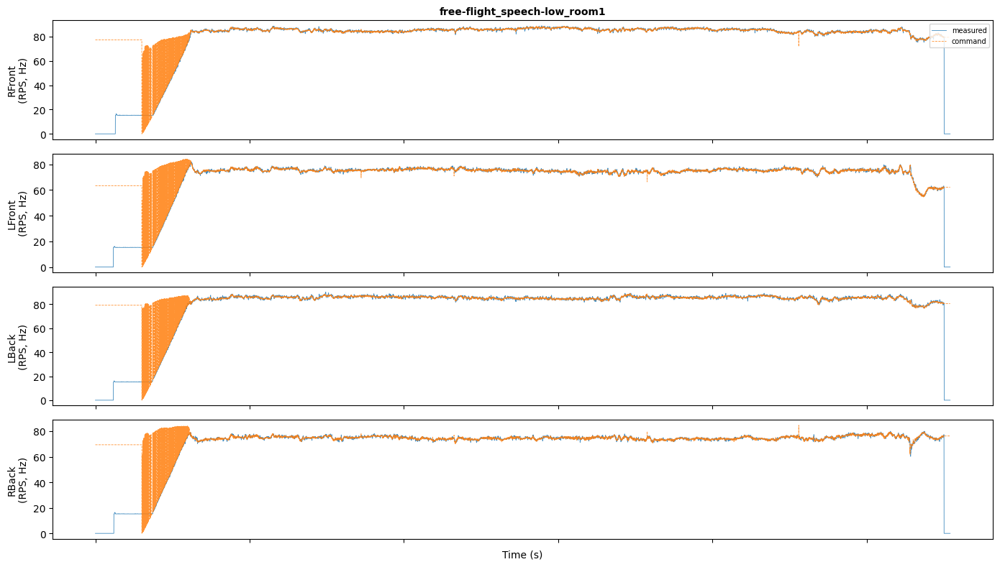

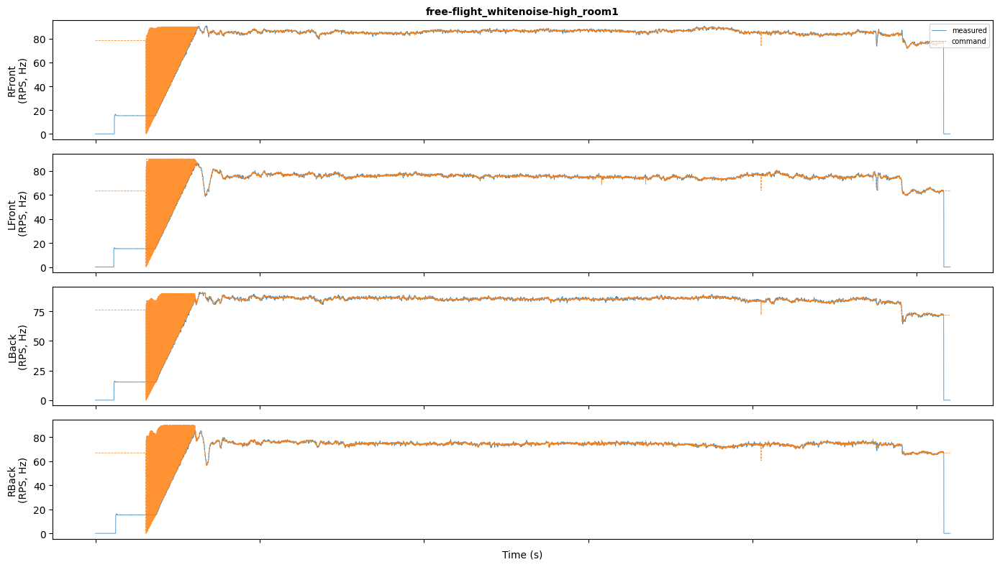

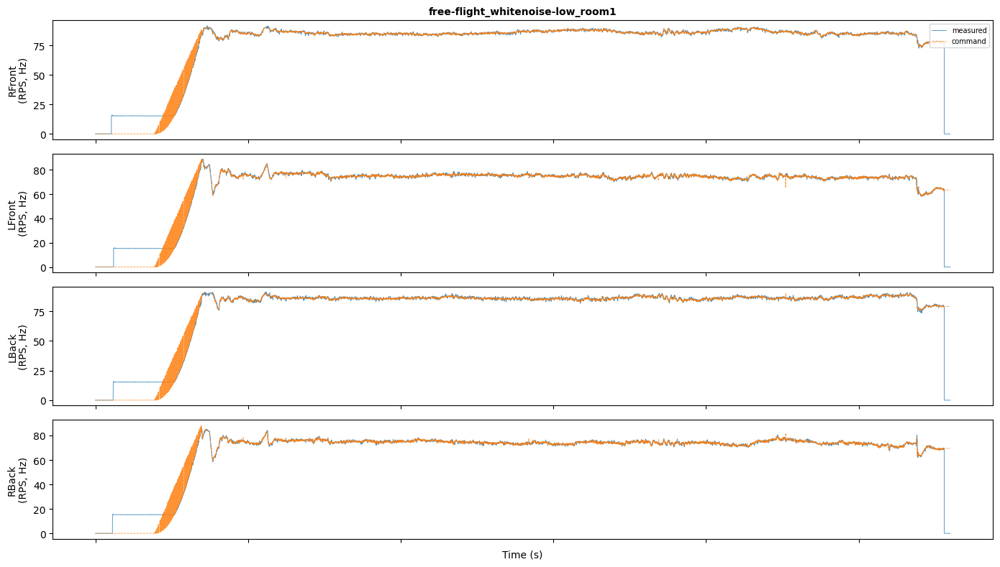

In [3]:
for rec_id in RECORDINGS:
    fig, axs = plt.subplots(4, 1, figsize=(14, 8), sharex=True)
    plot_one_recording(rec_id, axs)
    fig.tight_layout()
    plt.show()

# Some evals

In [4]:
from data_processing.dregon import load_dregon_dataset


def plot_per_rotor_comparison(audio, gt, preds_dict, title, method_keys="simple_conv",
                              figsize=(9, 4)):
    """Detailed per-rotor plot for one chosen method vs GT."""
    if not isinstance(method_keys, list):
        method_keys = [method_keys]

    duration = len(audio) / SR  # noqa: F821
    num_axes = 1 + len(method_keys)
    fig, axes = plt.subplots(num_axes, 1, figsize=figsize,
                             gridspec_kw={"height_ratios": [1]*num_axes , "hspace": 0.35})

    # spectrogram
    ax = axes[0]
    spec = np.abs(np.fft.rfft(
        np.lib.stride_tricks.sliding_window_view(audio, N_FFT)[::HOP_LENGTH] *  # noqa: F821
        np.hanning(N_FFT), axis=-1))  # noqa: F821
    log_mag = np.log1p(spec.T)
    ax.imshow(log_mag, origin="lower", aspect="auto",
              extent=[0, duration, 0, SR / 2 / 1000], cmap="magma")  # noqa: F821
    ax.set_ylim(0, 4)
    ax.set_ylabel("freq [kHz]")
    ax.set_title(title)
    ax.set_xticklabels([])
    ax.grid(False)

    # per-rotor traces
    for i, method_key in enumerate(method_keys):
        ax = axes[1+i]
        t = np.linspace(0, duration, gt.shape[1])
        pred = preds_dict[method_key]
        min_len = min(gt.shape[1], pred.shape[1])
        t = t[:min_len]
        for r in range(4):
            ax.plot(t, gt[r, :min_len], ":", color=ROTOR_COLORS[r], lw=0.6, alpha=0.5)  # noqa: F821
            t_pred = np.linspace(0, duration, pred.shape[1])[:min_len]
            ax.plot(t_pred, pred[r, :min_len], "-", color=ROTOR_COLORS[r], lw=0.8,  # noqa: F821
                    alpha=0.75, label=f"R{r+1}")
        ax.set_xlabel("time [s]")
        ax.set_ylabel("rotor speed [rev/s]")
        ax.set_xlim(0, duration)
        ax.legend(title=method_key, frameon=False, loc="upper right", fontsize=7, ncol=4)
    return fig


In [5]:
dregon = load_dregon_dataset('../data', download=False)

In [6]:
dregon['in_flight_noise'][0]

{'recording_id': 'free-flight_nosource_room1',
 'split': 'in_flight_noise',
 'flight_type': 'free-flight',
 'source_type': '',
 'source_level': '',
 'room': 'room1',
 'motor_id': -1,
 'motor_speed': -1,
 'audio_path': '../data/DREGON/DREGON_free-flight_nosource_room1/DREGON_free-flight_nosource_room1.wav',
 'audiots_path': '../data/DREGON/DREGON_free-flight_nosource_room1/DREGON_free-flight_nosource_room1_audiots.mat',
 'imu_path': '../data/DREGON/DREGON_free-flight_nosource_room1/DREGON_free-flight_nosource_room1_imu.mat',
 'motors_path': '../data/DREGON/DREGON_free-flight_nosource_room1/DREGON_free-flight_nosource_room1_motors.mat',
 'sourcepos_path': '',
 'mic_positions_path': '../data/DREGON/micPos.txt',
 'rotor_positions_path': '../data/DREGON/coordinates.mat'}

## Measured − Command difference (per motor)

A single overlay plot showing the error (measured − command) for all recordings,
one subplot per motor.

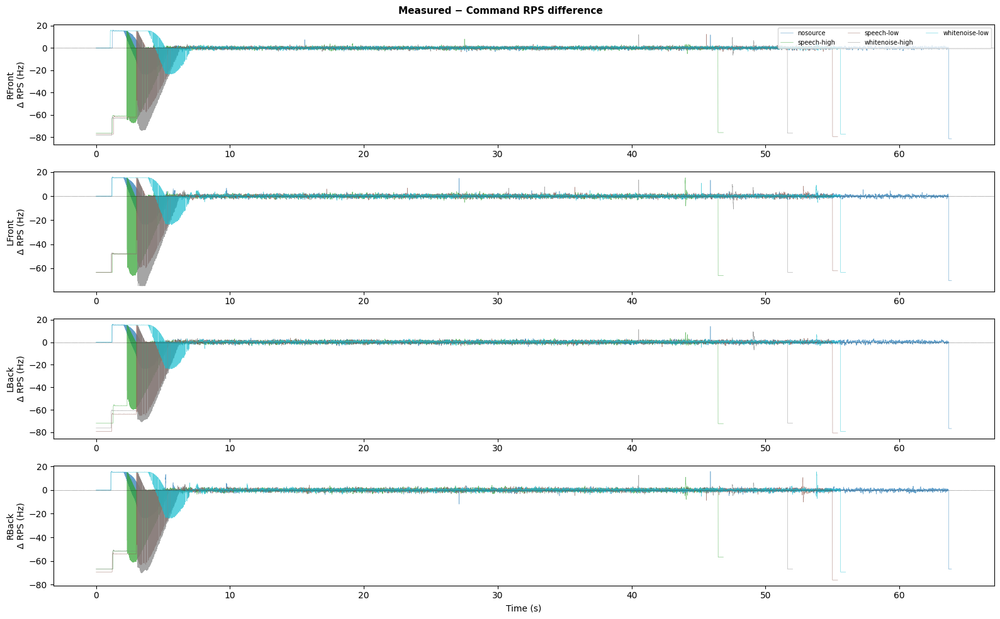

In [7]:
fig, axs = plt.subplots(4, 1, figsize=(16, 10), sharex=False)

colors = plt.cm.tab10(np.linspace(0, 1, len(RECORDINGS)))

for motor_idx in range(4):
    ax = axs[motor_idx]
    for rec_idx, rec_id in enumerate(RECORDINGS):
        t, measured, command = load_motor_data(rec_id)
        diff = measured[:, motor_idx] - command[:, motor_idx]
        label_short = rec_id.replace("free-flight_", "").replace("_room1", "")
        ax.plot(t, diff, linewidth=0.4, alpha=0.7, color=colors[rec_idx], label=label_short)
    ax.axhline(0, color="black", linewidth=0.5, linestyle=":")
    ax.set_ylabel(f"{MOTOR_NAMES[motor_idx]}\nΔ RPS (Hz)")
    if motor_idx == 0:
        ax.legend(fontsize=7, ncol=3, loc="upper right")

axs[-1].set_xlabel("Time (s)")
fig.suptitle("Measured − Command RPS difference", fontsize=11, fontweight="bold")
fig.tight_layout()
plt.show()

## Per-recording error statistics

In [5]:
print(f"{'Recording':<45} {'Motor':<8} {'Mean Δ':>8} {'Std Δ':>8} {'MAE':>8} {'Max|Δ|':>8}")
print("-" * 90)
for rec_id in RECORDINGS:
    t, measured, command = load_motor_data(rec_id)
    diff = measured - command  # (n, 4)
    for i, name in enumerate(MOTOR_NAMES):
        d = diff[:, i]
        print(f"{rec_id:<45} {name:<8} {np.mean(d):8.3f} {np.std(d):8.3f} {np.mean(np.abs(d)):8.3f} {np.max(np.abs(d)):8.3f}")
    print()

Recording                                     Motor      Mean Δ    Std Δ      MAE   Max|Δ|
------------------------------------------------------------------------------------------
free-flight_nosource_room1                    RFront      0.078    5.541    1.330   81.448
free-flight_nosource_room1                    LFront      0.106    5.063    1.356   70.354
free-flight_nosource_room1                    LBack       0.139    5.360    1.438   76.700
free-flight_nosource_room1                    RBack       0.129    4.946    1.358   66.918

free-flight_speech-high_room1                 RFront     -4.720   17.677    5.497   76.366
free-flight_speech-high_room1                 LFront     -3.920   14.822    4.758   66.143
free-flight_speech-high_room1                 LBack      -4.394   16.597    5.279   72.310
free-flight_speech-high_room1                 RBack      -4.009   15.123    4.860   66.965

free-flight_speech-low_room1                  RFront     -4.627   17.664    5.405   79.3

## No-source recordings: command speeds (room2)

The five room2 no-source recordings only have `command` (no `measured`).
Plotting their command speeds for comparison with `free-flight_nosource_room1`.

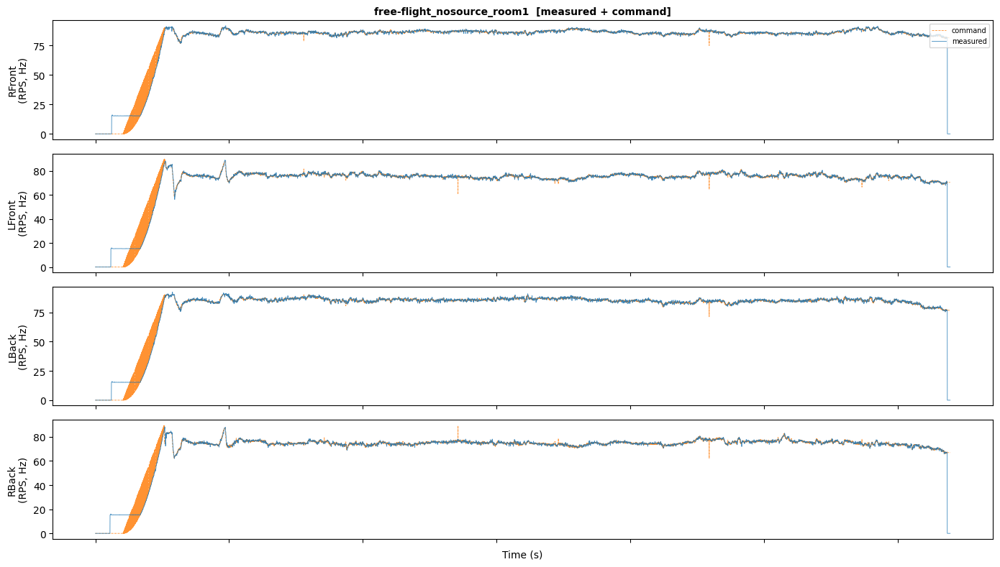

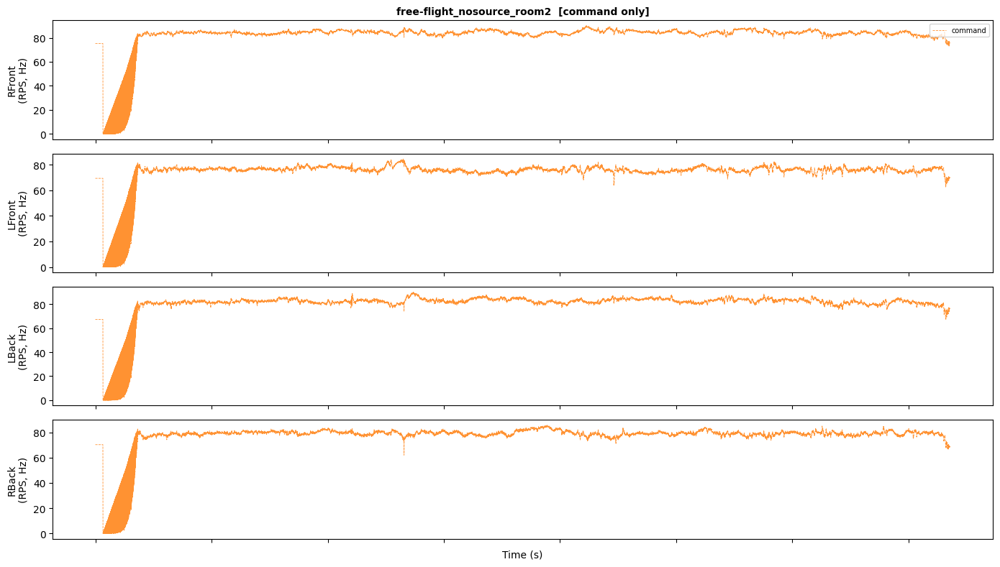

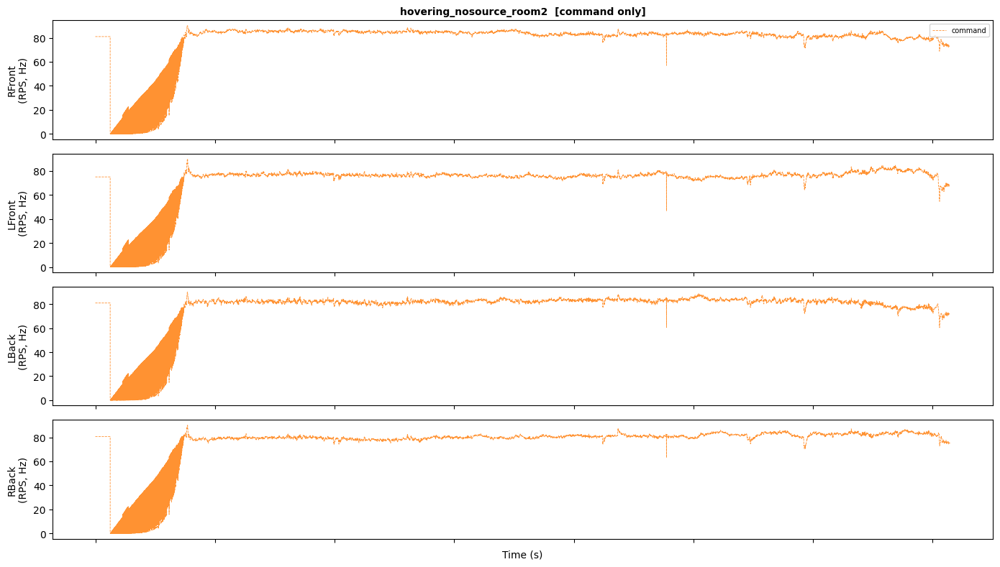

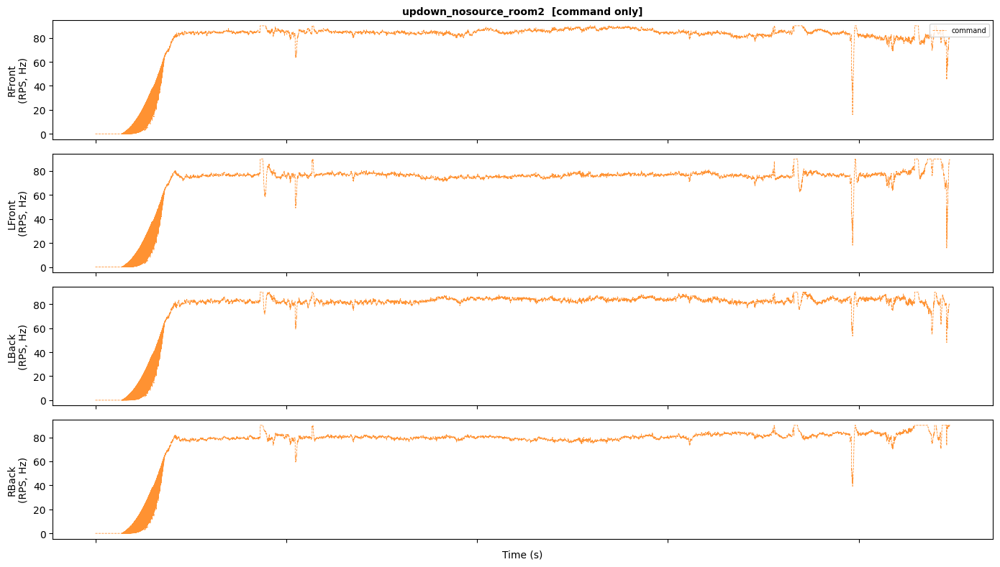

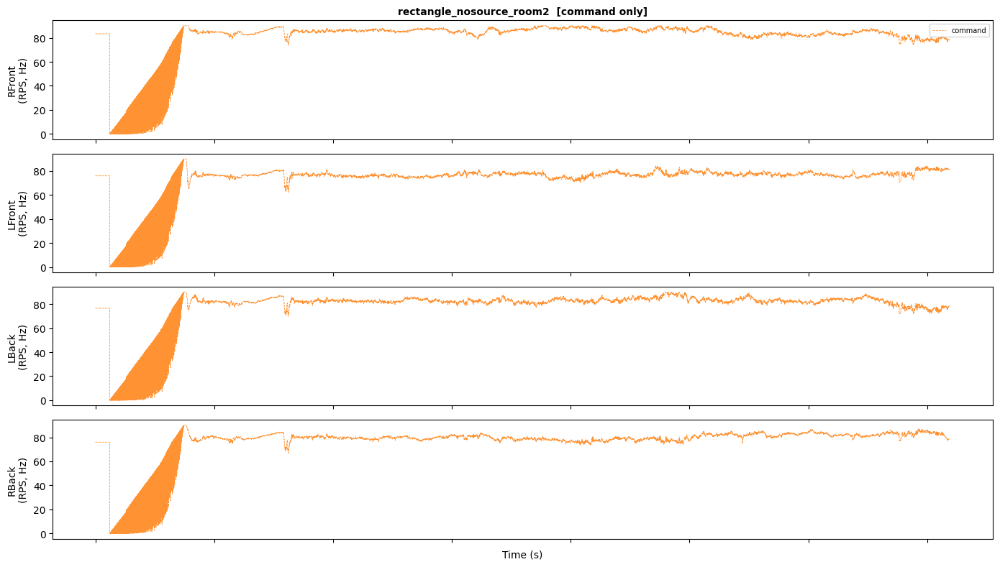

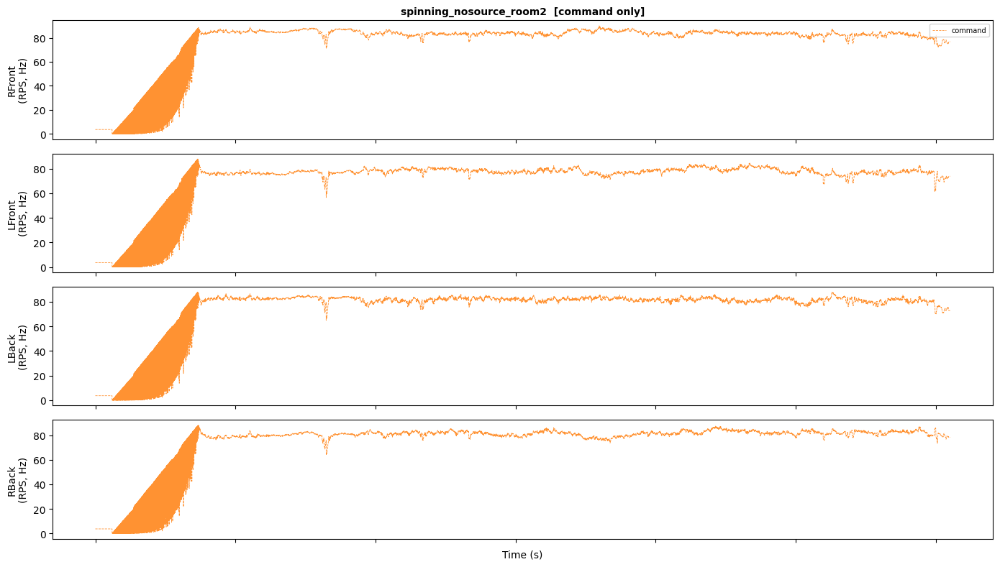

In [6]:
NOSOURCE_RECORDINGS = [
    "free-flight_nosource_room1",
    "free-flight_nosource_room2",
    "hovering_nosource_room2",
    "updown_nosource_room2",
    "rectangle_nosource_room2",
    "spinning_nosource_room2",
]


def load_motor_data_nosource(recording_id):
    """Load command (and measured if present) from a no-source recording."""
    dregon_dir = DATA_DIR / f"DREGON_{recording_id}"
    motors_path = dregon_dir / f"DREGON_{recording_id}_motors.mat"
    mat = scipy.io.loadmat(str(motors_path))
    motor = mat["motor"]
    ts = motor["timestamps"][0, 0].flatten()
    command = motor["command"][0, 0]  # (n_samples, 4)
    t_sec = ts - ts[0]
    has_measured = "measured" in motor.dtype.names
    measured = motor["measured"][0, 0] if has_measured else None
    return t_sec, command, measured, has_measured


for rec_id in NOSOURCE_RECORDINGS:
    t, command, measured, has_measured = load_motor_data_nosource(rec_id)
    fig, axs = plt.subplots(4, 1, figsize=(14, 8), sharex=True)

    for i, ax in enumerate(axs):
        ax.plot(t, command[:, i], linewidth=0.6, alpha=0.85,
                linestyle="--", color="C1", label="command")
        if has_measured:
            ax.plot(t, measured[:, i], linewidth=0.6, alpha=0.85,
                    color="C0", label="measured")
        ax.set_ylabel(f"{MOTOR_NAMES[i]}\n(RPS, Hz)")
        if i == 0:
            ax.legend(fontsize=7, loc="upper right")
        if i < 3:
            ax.set_xticklabels([])
    axs[-1].set_xlabel("Time (s)")
    src_label = "measured + command" if has_measured else "command only"
    axs[0].set_title(f"{rec_id}  [{src_label}]", fontsize=10, fontweight="bold")
    fig.tight_layout()
    plt.show()

## Cleaning: step artifact + takeoff spikes

Two artifacts are cleaned from the command signal:

1. **Step artifact** (see section below) — initial block of stale constant
   values is zeroed out.
2. **Takeoff spikes** — a median filter removes impulsive upward spikes during
   the ramp-up while preserving the smooth trend.

Below: compare raw command, cleaned command, and measured (where available)
for the first 10 seconds of each recording.

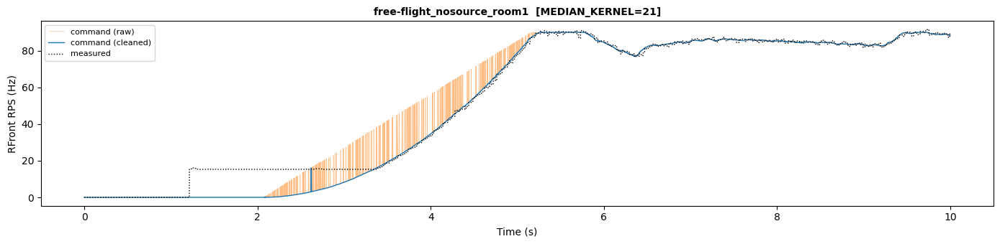

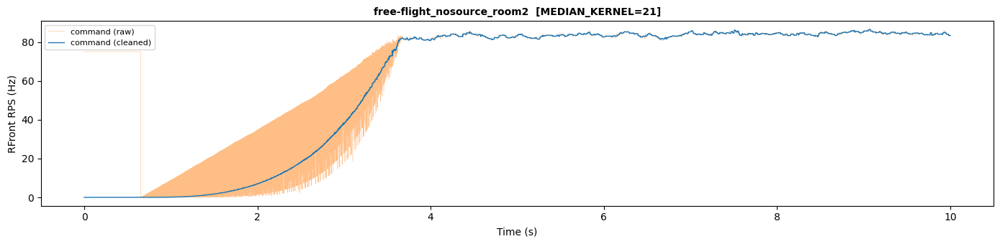

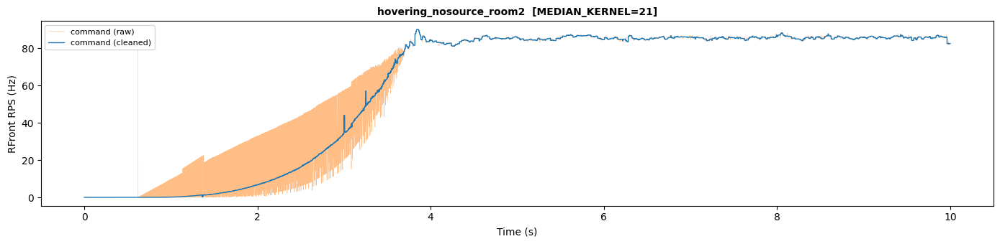

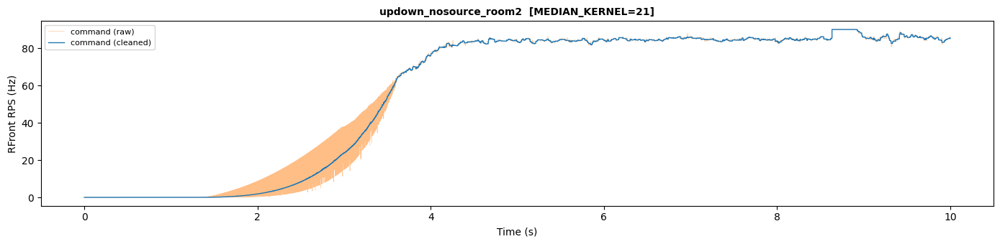

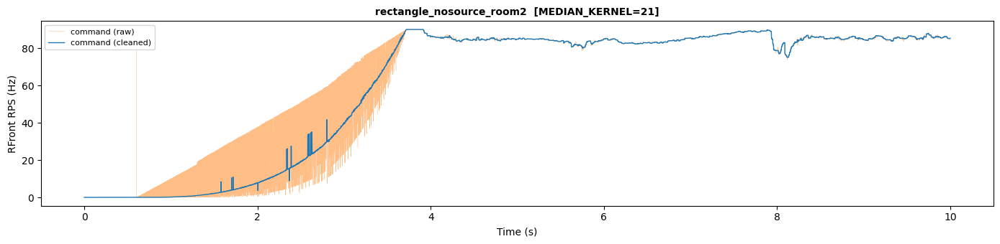

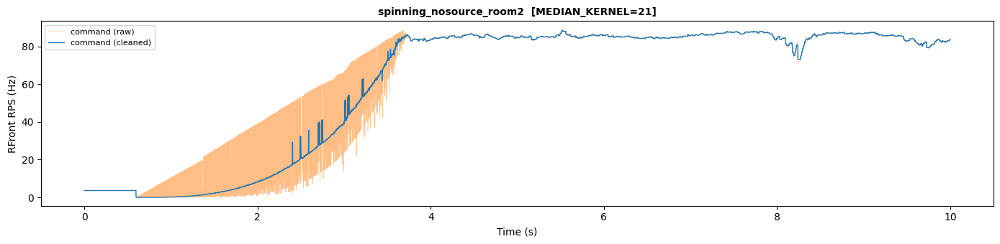

In [7]:
from scipy.ndimage import median_filter

MEDIAN_KERNEL = 21  # ~23 ms at ~929 Hz motor rate — removes 1-3 sample spikes



def _find_step_artifact_length(command):
    """Detect initial constant-value logging artifact and return its length."""
    n_samples = len(command)
    if n_samples < 2:
        return 0
    init_val = command[0, 0]
    if init_val < 30.0:
        return 0
    n_same = 0
    for j in range(n_samples):
        if command[j, 0] == init_val:
            n_same += 1
        else:
            break
    return n_same if n_same >= 100 else 0


def clean_command_spikes(command, kernel=MEDIAN_KERNEL):
    """Clean command: remove step artifact then median-filter spikes.

    1. Zero out initial block of stale constant FC values (step artifact).
    2. Median-filter to remove impulsive takeoff spikes.
    """
    cleaned = command.copy()
    n_step = _find_step_artifact_length(command)
    if n_step > 0:
        cleaned[:n_step] = 0.0
    return median_filter(cleaned, size=(kernel, 1), mode='reflect')


# ---- Plot cleaning results for first 10s of each recording ----
for rec_id in NOSOURCE_RECORDINGS:
    t, command, measured, has_measured = load_motor_data_nosource(rec_id)
    cmd_clean = clean_command_spikes(command)

    # First 10 seconds
    mask = t <= 10
    t10 = t[mask]
    cmd10 = command[mask, 0]
    clean10 = cmd_clean[mask, 0]

    fig, ax = plt.subplots(figsize=(14, 3.5))
    ax.plot(t10, cmd10, linewidth=0.4, alpha=0.5, color='C1', label='command (raw)')
    ax.plot(t10, clean10, linewidth=1.0, color='C0', label='command (cleaned)')
    if has_measured:
        meas10 = measured[mask, 0]
        ax.plot(t10, meas10, linewidth=1.0, color='black', linestyle=':', label='measured')
    ax.set_ylabel('RFront RPS (Hz)')
    ax.set_xlabel('Time (s)')
    ax.legend(fontsize=8, loc='upper left')
    ax.set_title(f'{rec_id}  [{MEDIAN_KERNEL=}]', fontsize=10, fontweight='bold')
    fig.tight_layout()
    plt.show()

### Cleaning error vs measured (recordings with both fields)

Quantify how much the median-filtered command improves agreement with measured speed,
compared to raw command.

In [8]:
print(f"{'Recording':<40} {'Phase':<12} {'Raw MAE':>10} {'Clean MAE':>10} {'Improvement':>12}")
print("-" * 88)

for rec_id in RECORDINGS:
    t, measured, command = load_motor_data(rec_id)
    cmd_clean = clean_command_spikes(command)

    # Takeoff phase: first 8s
    mask_takeoff = t <= 8
    # Cruise: after 8s
    mask_cruise = t >= 8

    for phase_name, mask in [('takeoff', mask_takeoff), ('cruise', mask_cruise)]:
        raw_mae = np.mean(np.abs(command[mask, 0] - measured[mask, 0]))
        clean_mae = np.mean(np.abs(cmd_clean[mask, 0] - measured[mask, 0]))
        impr = (1 - clean_mae / raw_mae) * 100 if raw_mae > 0 else 0
        print(f"{rec_id:<40} {phase_name:<12} {raw_mae:10.3f} {clean_mae:10.3f} {impr:11.1f}%")
    print()

Recording                                Phase           Raw MAE  Clean MAE  Improvement
----------------------------------------------------------------------------------------
free-flight_nosource_room1               takeoff           4.154      3.756         9.6%
free-flight_nosource_room1               cruise            0.921      0.897         2.6%

free-flight_speech-high_room1            takeoff          24.535      3.463        85.9%
free-flight_speech-high_room1            cruise            1.435      1.404         2.2%

free-flight_speech-low_room1             takeoff          29.483      4.586        84.4%
free-flight_speech-low_room1             cruise            1.270      1.242         2.3%

free-flight_whitenoise-high_room1        takeoff          30.890      4.721        84.7%
free-flight_whitenoise-high_room1        cruise            1.356      1.327         2.1%

free-flight_whitenoise-low_room1         takeoff           7.846      7.447         5.1%
free-flight_white

## Step artifact: stale FC initialization values

Some recordings start with a block of **bit-identical** high command values
(60–83 Hz) that persist for 0.6–3.1 s, then all four motors change simultaneously.
During this period the measured speed is 0 — the motors aren't spinning yet.
This is stale flight-controller initialization data logging.

Detection: if the first value repeats identically for ≥100 samples (>0.1 s)
and is above 30 Hz, it's a step artifact — zero it out.

Recording                                   Step len  Step dur                 Init cmd (4 motors)
----------------------------------------------------------------------------------------------------
free-flight_nosource_room1                      none
free-flight_nosource_room2                    628 smp   0.650s   [ 75.2  69.3  67.2  70.3]
hovering_nosource_room2                       606 smp   0.621s   [ 81.0  75.0  80.9  80.6]
updown_nosource_room2                           none
rectangle_nosource_room2                      598 smp   0.602s   [ 83.4  75.9  76.6  75.9]
spinning_nosource_room2                         none
free-flight_speech-high_room1                2295 smp   2.315s   [ 76.4  63.4  71.8  67.0]
free-flight_speech-low_room1                 2977 smp   3.011s   [ 77.2  63.4  79.2  69.4]
free-flight_whitenoise-high_room1            3056 smp   3.090s   [ 78.5  63.3  76.2  67.0]
free-flight_whitenoise-low_room1                none


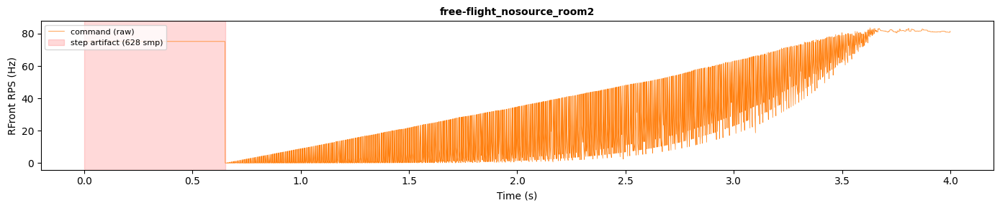

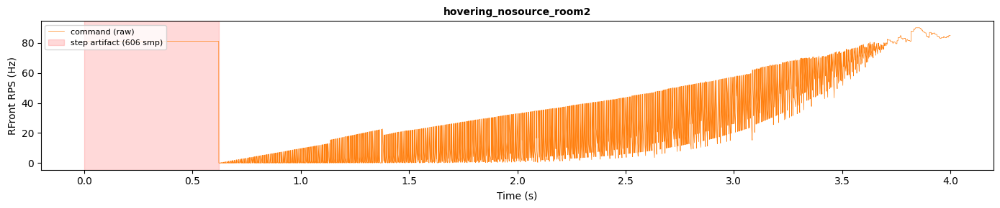

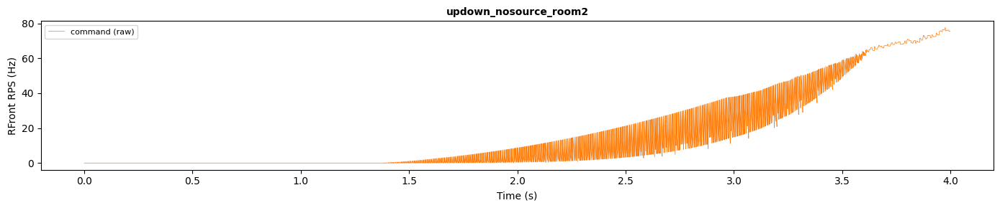

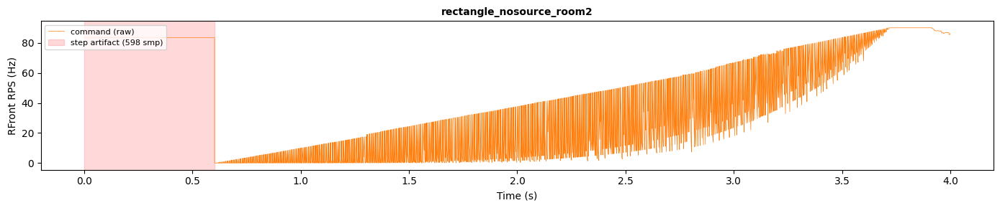

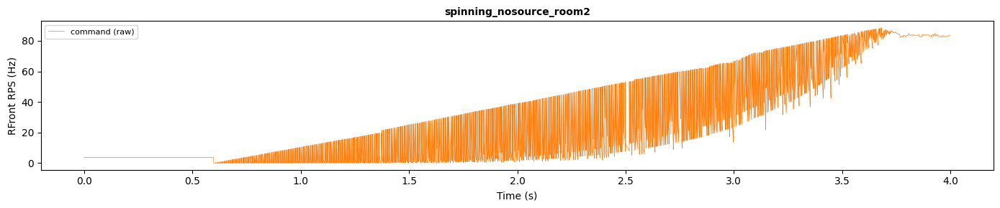

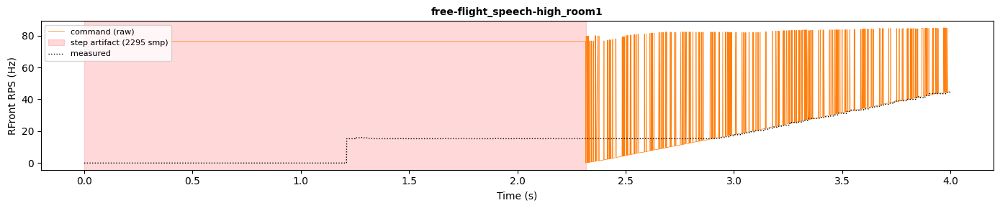

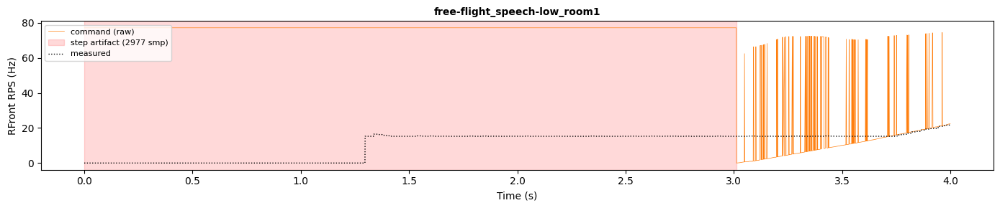

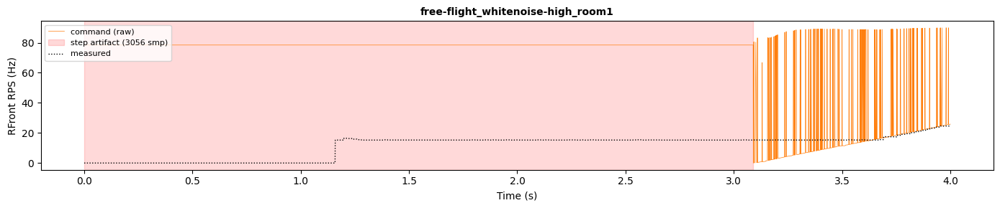

In [9]:
ALL_RECORDINGS = [
    "free-flight_nosource_room1",
    "free-flight_nosource_room2",
    "hovering_nosource_room2",
    "updown_nosource_room2",
    "rectangle_nosource_room2",
    "spinning_nosource_room2",
    "free-flight_speech-high_room1",
    "free-flight_speech-low_room1",
    "free-flight_whitenoise-high_room1",
    "free-flight_whitenoise-low_room1",
]

print(f"{'Recording':<42} {'Step len':>9} {'Step dur':>9} {'Init cmd (4 motors)':>35}")
print("-" * 100)

for rec_id in ALL_RECORDINGS:
    dregon_dir = DATA_DIR / f"DREGON_{rec_id}"
    motors_path = dregon_dir / f"DREGON_{rec_id}_motors.mat"
    mat = scipy.io.loadmat(str(motors_path))
    command = mat["motor"]["command"][0, 0]

    n_step = _find_step_artifact_length(command)
    if n_step > 0:
        ts = mat["motor"]["timestamps"][0, 0].flatten()
        dur = ts[n_step - 1] - ts[0]
        init_vals = command[0]
        vals_str = " ".join([f"{v:5.1f}" for v in init_vals])
        print(f"{rec_id:<42} {n_step:>6} smp {dur:>7.3f}s   [{vals_str}]")
    else:
        print(f"{rec_id:<42} {"none":>9}")

# Visual check: plot first 4s for recordings WITH the step artifact
step_recs = [r for r in ALL_RECORDINGS if "nosource_room2" in r
             or "speech-high" in r or "speech-low" in r or "whitenoise-high" in r
             or "hovering" in r or "rectangle" in r]

for rec_id in step_recs:
    t, command, measured, has_measured = load_motor_data_nosource(rec_id)
    n_step = _find_step_artifact_length(command)

    mask = t <= 4
    t4 = t[mask]
    cmd4 = command[mask, 0]

    fig, ax = plt.subplots(figsize=(14, 3))
    ax.plot(t4, cmd4, linewidth=0.5, color='C1', label='command (raw)')
    if n_step > 0:
        ax.axvspan(0, t[min(n_step, len(t)-1)], alpha=0.15, color='red', label=f'step artifact ({n_step} smp)')
    if has_measured:
        ax.plot(t4, measured[mask, 0], linewidth=1.0, color='black', linestyle=':', label='measured')
    ax.set_ylabel('RFront RPS (Hz)')
    ax.set_xlabel('Time (s)')
    ax.legend(fontsize=8, loc='upper left')
    ax.set_title(rec_id, fontsize=10, fontweight='bold')
    fig.tight_layout()
    plt.show()

## Measured standby jump

In all room1 recordings (with measured data), the measured speed jumps from 0
to ~15 Hz at t ≈ 1.05–1.30 s — the motors spinning up to idle/standby speed
before the actual flight ramp-up begins. Audio analysis confirms negligible
acoustic contribution at this speed (15 RPS × 2-blade = 30 Hz BPF, barely
audible at idle). This is real data, not an artifact.

## Spectrograms + RPS: first 6s of each no-source recording

High-contrast spectrogram (top) aligned with cleaned command and measured RPS
(bottom). Audio player below each figure.

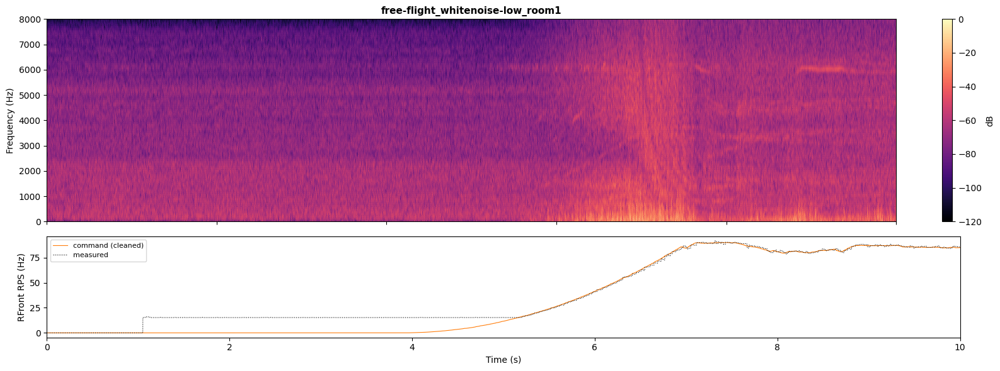

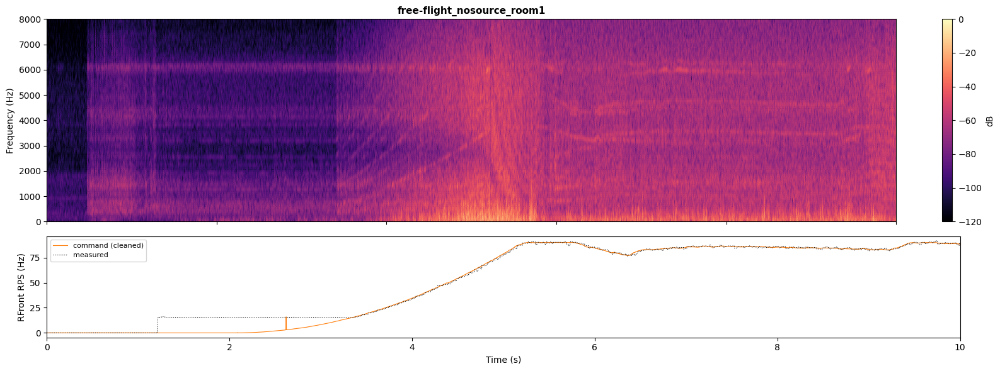

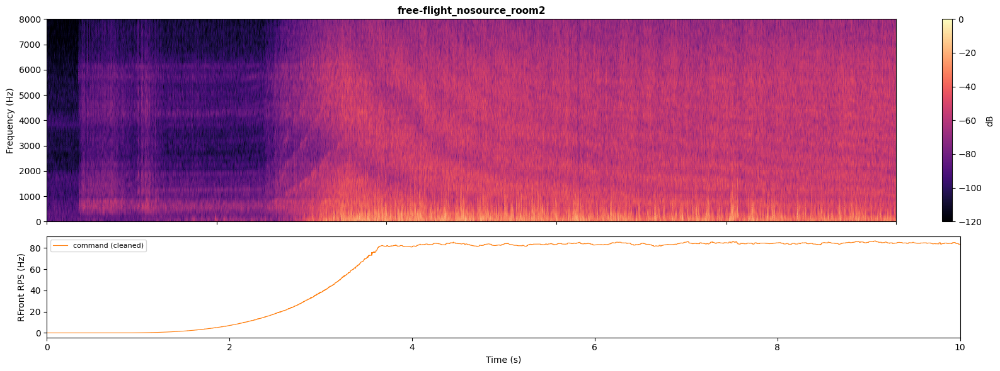

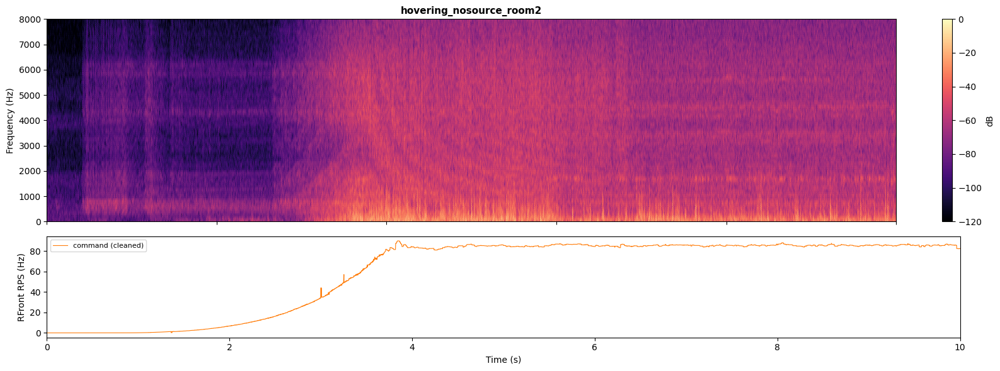

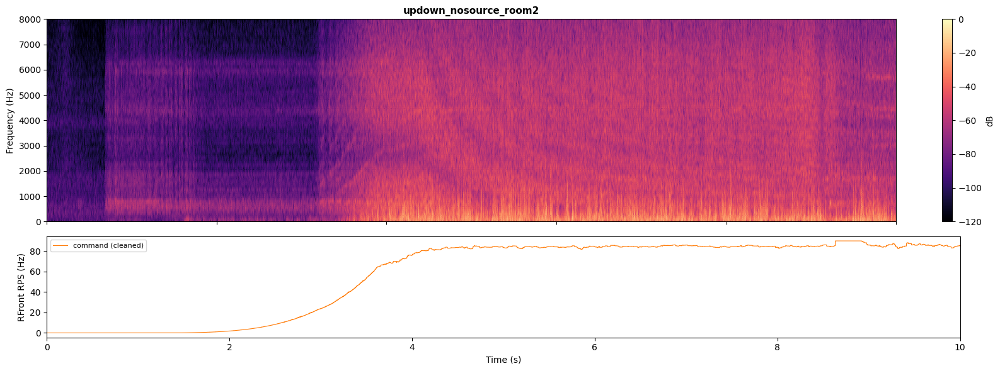

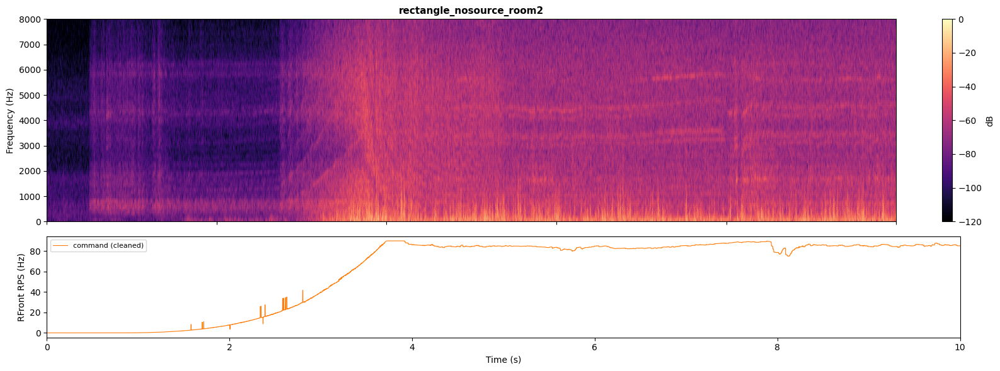

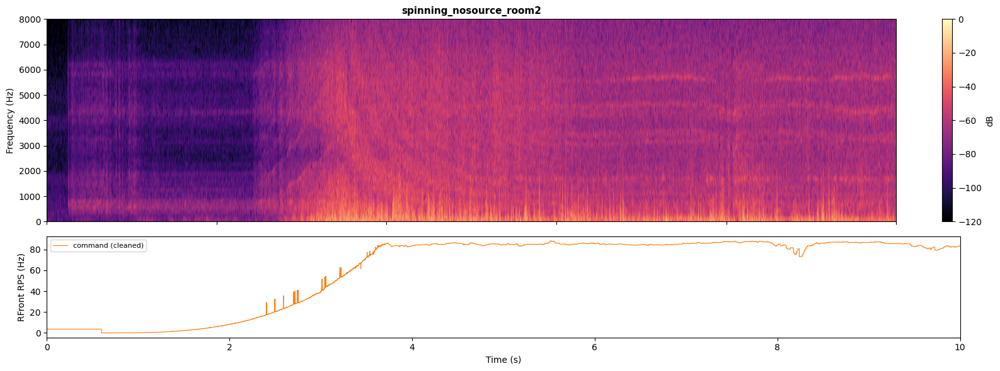

In [14]:
import soundfile as sf
from IPython.display import Audio, display
from scipy.signal import stft

NOSOURCE_RECORDINGS = [
    "free-flight_whitenoise-low_room1",
    "free-flight_nosource_room1",
    "free-flight_nosource_room2",
    "hovering_nosource_room2",
    "updown_nosource_room2",
    "rectangle_nosource_room2",
    "spinning_nosource_room2",
]

T_MAX = 10.0        # seconds to show
SPEC_VMAX_DB = -120  # dB floor for spectrogram colormap (lower = more contrast)
SPEC_NPERSEG = 512  # FFT size
SPEC_NOVERLAP = 448 # high overlap for smooth time axis


def load_audio_and_rps(rec_id):
    """Load audio (ch0), motor timestamps, command, measured for a recording."""
    dregon_dir = DATA_DIR / f"DREGON_{rec_id}"

    # Audio
    wav_path = dregon_dir / f"DREGON_{rec_id}.wav"
    audio, sr = sf.read(str(wav_path))
    audio_ch0 = audio[:, 0] if audio.ndim > 1 else audio

    # Audio timestamps (for alignment with motor data)
    audiots_path = dregon_dir / f"DREGON_{rec_id}_audiots.mat"
    audiots_mat = scipy.io.loadmat(str(audiots_path))
    audio_ts0 = audiots_mat["audio_timestamps"].flatten()[0]


    # Motor data
    motors_path = dregon_dir / f"DREGON_{rec_id}_motors.mat"
    mat = scipy.io.loadmat(str(motors_path))
    motor = mat["motor"]
    ts_motor = motor["timestamps"][0, 0].flatten()
    t_motor = ts_motor - ts_motor[0]
    command = motor["command"][0, 0]  # (n, 4)
    has_measured = "measured" in motor.dtype.names
    measured = motor["measured"][0, 0] if has_measured else None

    # Audio sample index corresponding to motor t=0
    audio_start = int((ts_motor[0] - audio_ts0) * sr)

    return audio_ch0, sr, t_motor, command, measured, has_measured, audio_start


for rec_id in NOSOURCE_RECORDINGS:
    audio, sr, t_motor, command, measured, has_measured, audio_start = load_audio_and_rps(rec_id)

    # ---- Clean command ----
    n_step = _find_step_artifact_length(command) if '_find_step_artifact_length' in dir() else 0
    cmd_clean = command.copy()
    if n_step > 0:
        cmd_clean[:n_step] = 0.0
    cmd_clean = median_filter(cmd_clean, size=(21, 1), mode='reflect')

    # ---- Spectrogram (first T_MAX seconds) ----
    # Align audio with motor timeline: motor t=0 -> audio[audio_start]
    a0 = audio_start
    a1 = audio_start + int(T_MAX * sr)
    audio_seg = audio[a0:a1]
    f_spec, t_spec, Zxx = stft(audio_seg, sr, nperseg=SPEC_NPERSEG, noverlap=SPEC_NOVERLAP)
    spec_db = 20 * np.log10(np.abs(Zxx) + 1e-12)

    # ---- Motor data in the same time window ----
    mask_motor = t_motor <= T_MAX
    t_m = t_motor[mask_motor]
    cmd_m = cmd_clean[mask_motor, 0]  # RFront
    meas_m = measured[mask_motor, 0] if has_measured else None

    # ---- Plot ----
    fig, (ax_spec, ax_rps) = plt.subplots(2, 1, figsize=(16, 6), sharex=True,
                                          gridspec_kw={'height_ratios': [2, 1]})

    # Spectrogram
    im = ax_spec.pcolormesh(t_spec, f_spec, spec_db, shading='gouraud',
                            vmin=SPEC_VMAX_DB, vmax=0, cmap='magma')
    ax_spec.set_ylabel('Frequency (Hz)')
    ax_spec.set_ylim(0, 8000)
    plt.colorbar(im, ax=ax_spec, label='dB', fraction=0.02)

    # RPS
    ax_rps.plot(t_m, cmd_m, linewidth=0.8, color='C1', label='command (cleaned)')
    if has_measured:
        ax_rps.plot(t_m, meas_m, linewidth=0.8, color='black', linestyle=':', label='measured')
    ax_rps.set_ylabel('RFront RPS (Hz)')
    ax_rps.set_xlabel('Time (s)')
    ax_rps.legend(fontsize=8, loc='upper left')
    ax_rps.set_xlim(0, T_MAX)

    ax_spec.set_title(rec_id, fontsize=11, fontweight='bold')
    fig.tight_layout()
    plt.show()

    # ---- Playable audio (resample to 16 kHz for lighter playback) ----
    display(Audio(audio_seg, rate=sr, normalize=True))